### imports

In [1]:
import sys
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

# Caminho da pasta "Twitch"
base_dir = Path(os.getcwd()).resolve().parent  # Ajuste se necessário

# Adicionar as pasta ao sys.path
visualization_dir = base_dir / 'src' / 'visualization'
getData_dir = base_dir / 'src' / 'data'
sys.path.append(str(visualization_dir))
sys.path.append(str(getData_dir))

# Importar os módulos
try:
    import community_visualization
    import correlations
    import TwitchGraphs
    import TwitchVisualization
except ImportError:
    print("Erro: Não foi possível importar algum módulo. Verifique se o caminho está correto.")

# Paises
countries = ["PTBR", "DE", "ENGB", "ES", "FR", "RU"]

## Visualização de gráficos

### Definir parâmetros

#### Definir o diretório correto

#### Selecionar o País

In [2]:
# Escolher entre: DE, ENGB, ES, FR, PTBR, RU
country = "PTBR"

#### Variáveis Extras

In [3]:
# Definir o nome das ficheiros originais
Filedges = "musae_" + country + "_edges.csv"
Filetarget = "musae_" + country + "_target.csv"

# Definir o diretório dos ficheiros originais
edgePath = base_dir / 'data' / country / Filedges
targetPath = base_dir / 'data' / country / Filetarget

# Definir o diretório dos ficheiros tratados e do local das imagens
csv_path = base_dir / 'data' / country / f"twitch_network_metrics_{country}.csv"
output_dir = base_dir / 'docs' / "Imagens"

# Ler o ficheiro CSV
df = pd.read_csv(csv_path)
df

,node,degree,degree_centrality,closeness_centrality,betweenness_centrality,eigenvector_centrality,community_leiden,views,partner,mature,days,clustering_coef
0,127,767,0.401361,0.600943,0.099261,0.178778,0,32672093,True,False,1592,0.039011
1,1476,598,0.312925,0.559426,0.054895,0.145761,3,18475754,True,False,2195,0.044582
2,290,590,0.308739,0.559590,0.050112,0.151502,3,116392808,True,False,1896,0.050427
3,1297,587,0.307169,0.568412,0.050421,0.158668,0,7724802,True,False,2215,0.058404
4,467,582,0.304553,0.565050,0.043825,0.157239,0,11392773,True,False,1774,0.058236
...,...,...,...,...,...,...,...,...,...,...,...,...
1907,1828,1,0.000523,0.282025,0.000000,0.000060,2,5511,False,False,1168,0.000000
1908,145,1,0.000523,0.281692,0.000000,0.000089,1,39,False,False,1048,0.000000
1909,772,1,0.000523,0.263623,0.000000,0.000022,4,4193,False,True,979,0.000000
1910,1222,1,0.000523,0.254190,0.000000,0.000008,4,3432,False,False,2502,0.000000


#### Configurar o estilo dos gráficos

In [4]:
# Configuração de estilo dos gráficos
plt.style.use('dark_background')
sns.set_palette("colorblind")
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

### Visualização dos Grafos

Número de nós: 1912
Número de arestas: 31299


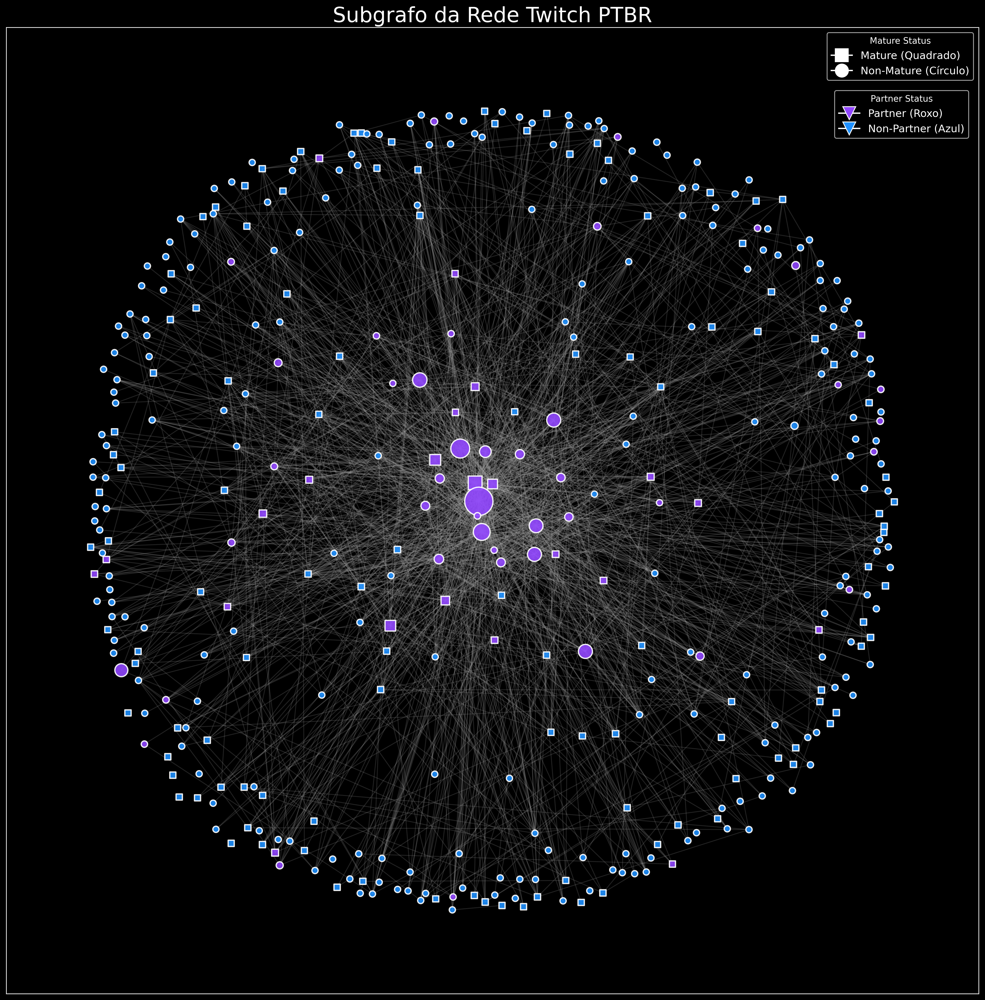

In [5]:
# Definir a percentagem de nós do grafo a utilizar
PercNodes = 7

TwitchVisualization.seeGraph(base_dir, edgePath, targetPath, PercNodes, country)

### Histograma das Variáveis

In [6]:
output_dir_hist = base_dir / 'docs' / "Imagens"
hist_folder = TwitchGraphs.create_subfolder('Histograms', output_dir_hist)

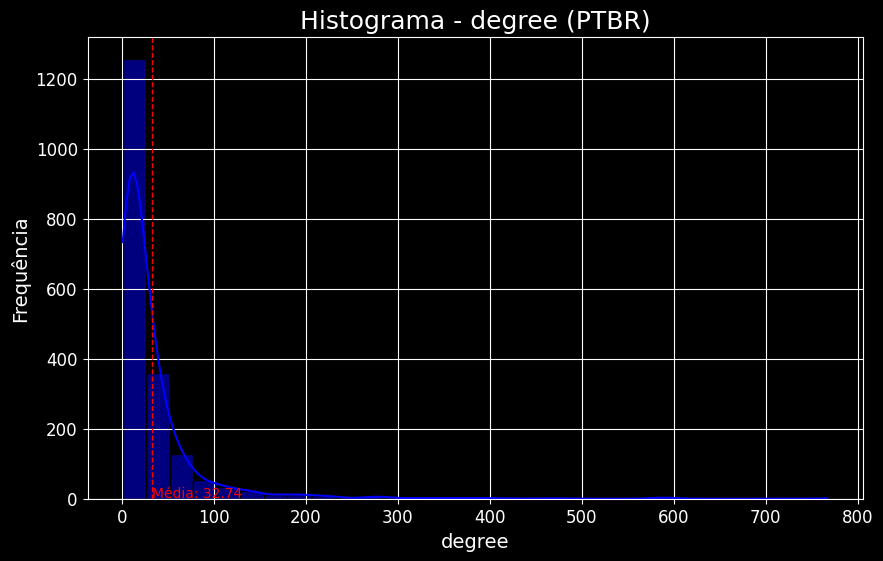

In [7]:
TwitchGraphs.plot_histogram(df = df, column_name = 'degree', color = 'blue', country = country, output_dir = output_dir_hist)

### PieChart das variáveis

In [8]:
output_dir_pie = base_dir / 'docs' / "Imagens"
piechart_folder = TwitchGraphs.create_subfolder('PieCharts', output_dir)

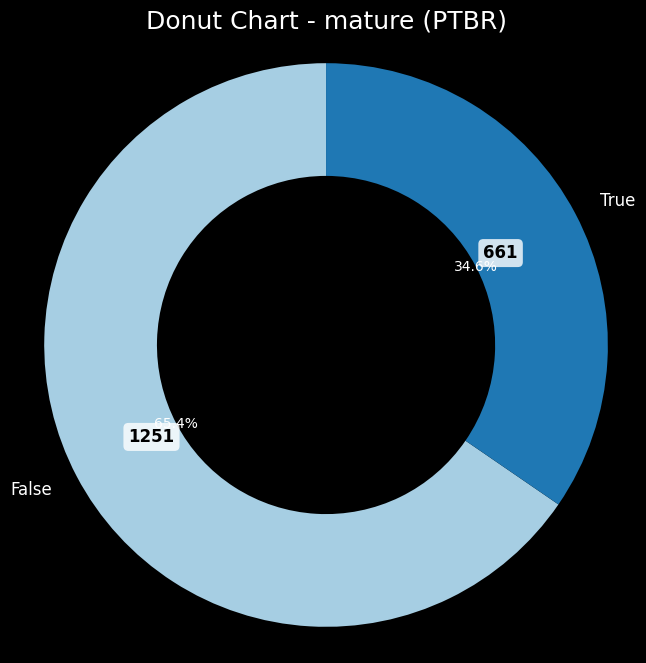

In [9]:
TwitchGraphs.plot_pie_chart(df = df, column_name = 'mature', country = country, output_dir = output_dir)

### Correlações

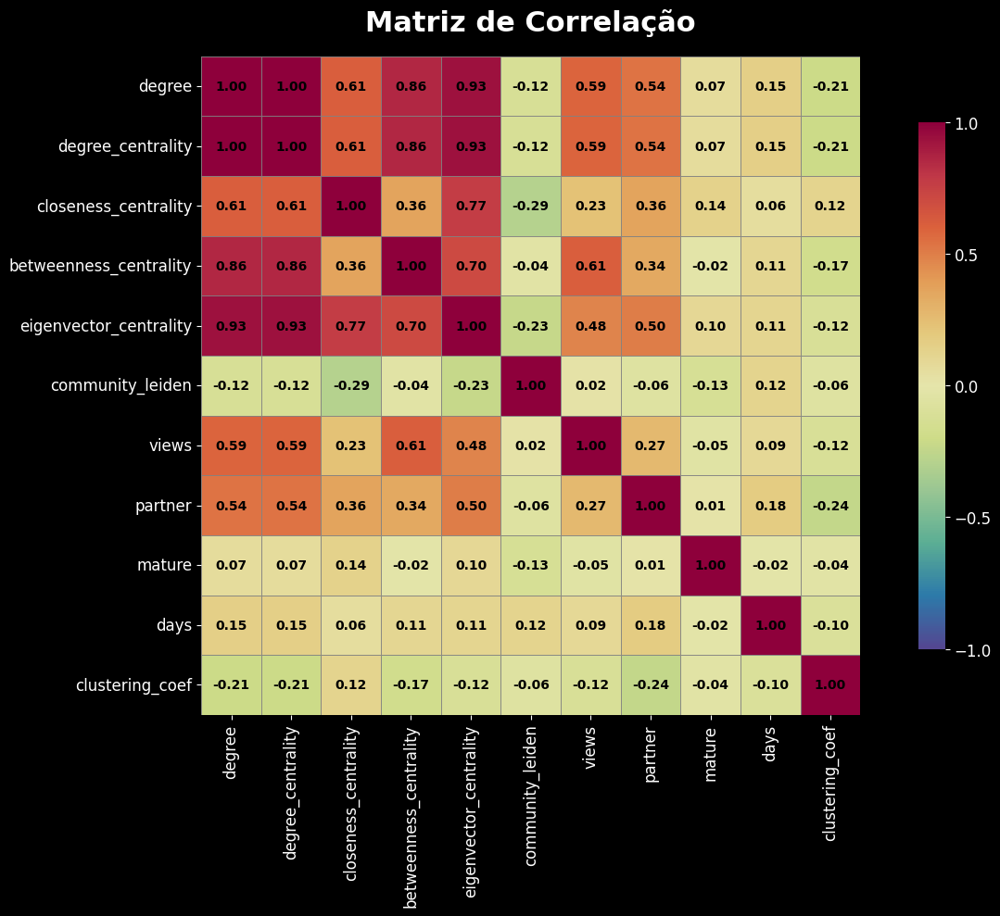

Imagem salva em: C:\Users\diogo\Desktop\ARA\Projeto\Twitch\docs\Imagens\CorrPlot\matriz_correlacao_PTBR.png


In [10]:
correlations.get_correlations(country)